# Importing Libraries And Ignoring Future Warnings 

In [1]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

# Importing Housing Dataset

In [2]:
housing = pd.read_csv("housing.csv")
housing.head()

,Order,PID,MS SubClass,MS Zoning,Lot Frontage,Lot Area,Street,Alley,Lot Shape,Land Contour,...,Fence,Misc Feature,Misc Val,Mo Sold,Yr Sold,Sale Type,Sale Condition,SalePrice,Year,Rooms
0,1,526301100,20,RL,141.0,31770,Pave,NaN,IR1,Lvl,...,NaN,NaN,0,5,2010,WD,Normal,215000,1999 or older,7 rooms or more
1,2,526350040,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,...,MnPrv,NaN,0,6,2010,WD,Normal,105000,1999 or older,6 rooms or less
2,3,526351010,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,...,NaN,Gar2,12500,6,2010,WD,Normal,172000,1999 or older,6 rooms or less
3,4,526353030,20,RL,93.0,11160,Pave,NaN,Reg,Lvl,...,NaN,NaN,0,4,2010,WD,Normal,244000,1999 or older,7 rooms or more
4,5,527105010,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,...,MnPrv,NaN,0,3,2010,WD,Normal,189900,1999 or older,6 rooms or less


In [3]:
housing.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2930 entries, 0 to 2929
Data columns (total 84 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Order            2930 non-null   int64  
 1   PID              2930 non-null   int64  
 2   MS SubClass      2930 non-null   int64  
 3   MS Zoning        2930 non-null   object 
 4   Lot Frontage     2440 non-null   float64
 5   Lot Area         2930 non-null   int64  
 6   Street           2930 non-null   object 
 7   Alley            198 non-null    object 
 8   Lot Shape        2930 non-null   object 
 9   Land Contour     2930 non-null   object 
 10  Utilities        2930 non-null   object 
 11  Lot Config       2930 non-null   object 
 12  Land Slope       2930 non-null   object 
 13  Neighborhood     2930 non-null   object 
 14  Condition 1      2930 non-null   object 
 15  Condition 2      2930 non-null   object 
 16  Bldg Type        2930 non-null   object 
 17  House Style   

# Creating Relational Plot

C:\Users\computer lab\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


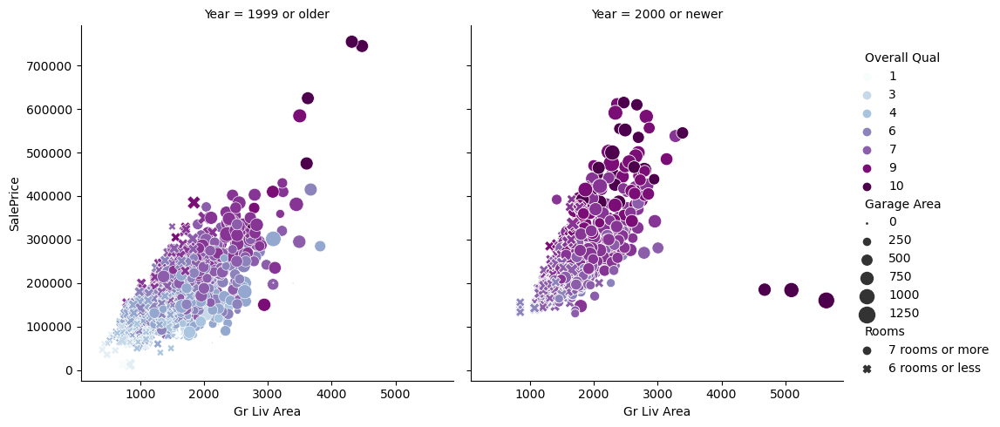

In [11]:
sns.reset_defaults()
sns.relplot(x = 'Gr Liv Area', y = 'SalePrice', data = housing, hue = 'Overall Qual', palette = 'BuPu',\
           size = 'Garage Area', sizes = (1,200), style = 'Rooms', col = "Year")

plt.show()

# As we can see that whenever 'ground living area' is increasing then price is also increasing but we can see that there are 
# 3 houses which have highest living area but prices are too low let's find out the reason that why that have lowest price

### Let's Investigate Why Those 3 Houses have Low Price?

In [16]:
housing["Gr Liv Area"].describe()

count    2930.000000
mean     1499.690444
std       505.508887
min       334.000000
25%      1126.000000
50%      1442.000000
75%      1742.750000
max      5642.000000
Name: Gr Liv Area, dtype: float64

In [20]:
housing["Gr Liv Area"].value_counts(bins = 10)

Gr Liv Area
(864.8, 1395.6]                1169
(1395.6, 1926.4]               1082
(1926.4, 2457.2]                341
(328.69100000000003, 864.8]     189
(2457.2, 2988.0]                123
(2988.0, 3518.8]                 17
(3518.8, 4049.6]                  4
(4049.6, 4580.4]                  2
(4580.4, 5111.2]                  2
(5111.2, 5642.0]                  1
Name: count, dtype: int64

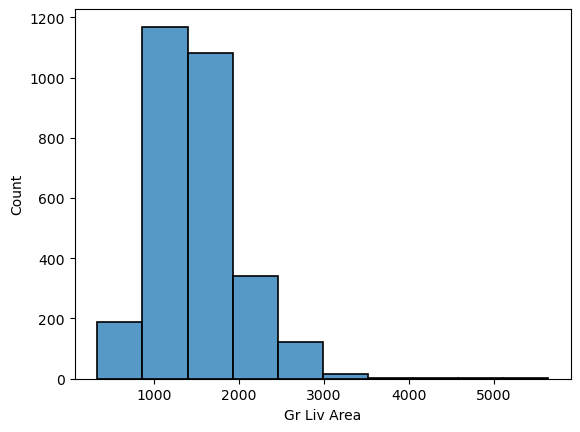

In [36]:
# Visualizing our frequecy Table
sns.histplot(data = housing, x = 'Gr Liv Area', bins = 10, edgecolor='black', linewidth = 1.2)

plt.show()

In [44]:
# Checking Correlation
housing[["Gr Liv Area", "SalePrice"]].corr()

,Gr Liv Area,SalePrice
Gr Liv Area,1.00000,0.70678
SalePrice,0.70678,1.00000


In [53]:
# Now seperate those column wihch are numeric
num_columns = housing[housing.select_dtypes(include=['number']).columns]
num_columns

,Order,PID,MS SubClass,Lot Frontage,Lot Area,Overall Qual,Overall Cond,Year Built,Year Remod/Add,Mas Vnr Area,...,Wood Deck SF,Open Porch SF,Enclosed Porch,3Ssn Porch,Screen Porch,Pool Area,Misc Val,Mo Sold,Yr Sold,SalePrice
0,1,526301100,20,141.0,31770,6,5,1960,1960,112.0,...,210,62,0,0,0,0,0,5,2010,215000
1,2,526350040,20,80.0,11622,5,6,1961,1961,0.0,...,140,0,0,0,120,0,0,6,2010,105000
2,3,526351010,20,81.0,14267,6,6,1958,1958,108.0,...,393,36,0,0,0,0,12500,6,2010,172000
3,4,526353030,20,93.0,11160,7,5,1968,1968,0.0,...,0,0,0,0,0,0,0,4,2010,244000
4,5,527105010,60,74.0,13830,5,5,1997,1998,0.0,...,212,34,0,0,0,0,0,3,2010,189900
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2925,2926,923275080,80,37.0,7937,6,6,1984,1984,0.0,...,120,0,0,0,0,0,0,3,2006,142500
2926,2927,923276100,20,NaN,8885,5,5,1983,1983,0.0,...,164,0,0,0,0,0,0,6,2006,131000
2927,2928,923400125,85,62.0,10441,5,5,1992,1992,0.0,...,80,32,0,0,0,0,700,7,2006,132000
2928,2929,924100070,20,77.0,10010,5,5,1974,1975,0.0,...,240,38,0,0,0,0,0,4,2006,170000


In [59]:
final_data = num_columns.iloc[:, 1:40]

In [165]:
final_data.corr()["SalePrice"].sort_values(ascending = True)

PID               -0.246521
Enclosed Porch    -0.128787
Kitchen AbvGr     -0.119814
Overall Cond      -0.101697
MS SubClass       -0.085092
Low Qual Fin SF   -0.037660
Bsmt Half Bath    -0.035835
Yr Sold           -0.030569
Misc Val          -0.015691
BsmtFin SF 2       0.005891
3Ssn Porch         0.032225
Mo Sold            0.035259
Pool Area          0.068403
Screen Porch       0.112151
Bedroom AbvGr      0.143913
Bsmt Unf SF        0.182855
Lot Area           0.266549
2nd Flr SF         0.269373
Bsmt Full Bath     0.276050
Half Bath          0.285056
Open Porch SF      0.312951
Wood Deck SF       0.327143
Lot Frontage       0.357318
BsmtFin SF 1       0.432914
Fireplaces         0.474558
TotRms AbvGrd      0.495474
Mas Vnr Area       0.508285
Garage Yr Blt      0.526965
Year Remod/Add     0.532974
Full Bath          0.545604
Year Built         0.558426
1st Flr SF         0.621676
Total Bsmt SF      0.632280
Garage Area        0.640401
Garage Cars        0.647877
Gr Liv Area        0

In [130]:
pd.set_option('display.max_columns', None)
final_data[(final_data["Gr Liv Area"] == 5642) | (final_data["Gr Liv Area"] == 5095) | \
           (final_data["SalePrice"] == 755000) | (final_data["SalePrice"] == 745000)]

,PID,MS SubClass,Lot Frontage,Lot Area,Overall Qual,Overall Cond,Year Built,Year Remod/Add,Mas Vnr Area,BsmtFin SF 1,BsmtFin SF 2,Bsmt Unf SF,Total Bsmt SF,1st Flr SF,2nd Flr SF,Low Qual Fin SF,Gr Liv Area,Bsmt Full Bath,Bsmt Half Bath,Full Bath,Half Bath,Bedroom AbvGr,Kitchen AbvGr,TotRms AbvGrd,Fireplaces,Garage Yr Blt,Garage Cars,Garage Area,Wood Deck SF,Open Porch SF,Enclosed Porch,3Ssn Porch,Screen Porch,Pool Area,Misc Val,Mo Sold,Yr Sold,SalePrice
1498,908154235,60,313.0,63887,10,5,2008,2008,796.0,5644.0,0.0,466.0,6110.0,4692,950,0,5642,2.0,0.0,2,1,3,1,12,3,2008.0,2.0,1418.0,214,292,0,0,0,480,0,1,2008,160000
1760,528320050,60,160.0,15623,10,5,1996,1996,0.0,2096.0,0.0,300.0,2396.0,2411,2065,0,4476,1.0,0.0,3,1,4,1,10,2,1996.0,3.0,813.0,171,78,0,0,0,555,0,7,2007,745000
1767,528351010,60,104.0,21535,10,6,1994,1995,1170.0,1455.0,0.0,989.0,2444.0,2444,1872,0,4316,0.0,1.0,3,1,4,1,10,2,1994.0,3.0,832.0,382,50,0,0,0,0,0,1,2007,755000
2180,908154195,20,128.0,39290,10,5,2008,2009,1224.0,4010.0,0.0,1085.0,5095.0,5095,0,0,5095,1.0,1.0,2,1,2,1,15,2,2008.0,3.0,1154.0,546,484,0,0,0,0,17000,10,2007,183850


In [129]:
final_data["SalePrice"].sort_values(ascending = False)

1767    755000
1760    745000
2445    625000
1063    615000
44      611657
         ...  
2880     35311
2843     35000
726      34900
1553     13100
181      12789
Name: SalePrice, Length: 2930, dtype: int64

In [127]:
housing["Gr Liv Area"].sort_values(ascending = False)

1498    5642
2180    5095
2181    4676
1760    4476
1767    4316
        ... 
2653     492
2880     480
907      438
1302     407
1901     334
Name: Gr Liv Area, Length: 2930, dtype: int64

### Conclusion of Those three houses Which have low prices
as per analysis i checked there is no reason to decrease the prices of those houses so according to analysis the price has been added mistakly 

# Heatmaps

A **heatmap** is a graphical representation of data where values are depicted as colors on a grid. It's often used to show patterns or variations in data by assigning different colors to different values. 

- Warmer colors (like red or yellow) typically represent higher values, 
- while cooler colors (like blue or green) represent lower values. 

Heatmaps make it easier to spot trends or differences in data at a glance.

## Seprating Font Properties For Heading

In [131]:
font = {'fontfamily' : 'Berlin Sans FB' , 'fontsize' : 25}

## Seprating 10 Features/Columns

In [132]:
cols = ['SalePrice'      , 'Overall Qual'  , 'Gr Liv Area',
        'Garage Cars'    , 'Garage Area'   , 'PID',
        'Enclosed Porch' , 'Kitchen AbvGr' ,
        'Overall Cond'   , 'MS SubClass']

In [133]:
housing[cols]

housing_new = housing[cols]
housing_new.head(3)

,SalePrice,Overall Qual,Gr Liv Area,Garage Cars,Garage Area,PID,Enclosed Porch,Kitchen AbvGr,Overall Cond,MS SubClass
0,215000,6,1656,2.0,528.0,526301100,0,1,5,20
1,105000,5,896,1.0,730.0,526350040,0,1,6,20
2,172000,6,1329,1.0,312.0,526351010,0,1,6,20


## Finding Correlation Of The 10 Features/Columns

In [139]:
housing_new.corr()

,SalePrice,Overall Qual,Gr Liv Area,Garage Cars,Garage Area,PID,Enclosed Porch,Kitchen AbvGr,Overall Cond,MS SubClass
SalePrice,1.000000,0.799262,0.706780,0.647877,0.640401,-0.246521,-0.128787,-0.119814,-0.101697,-0.085092
Overall Qual,0.799262,1.000000,0.570556,0.599545,0.563503,-0.263147,-0.140332,-0.159744,-0.094812,0.039419
Gr Liv Area,0.706780,0.570556,1.000000,0.488829,0.484892,-0.107579,0.004030,0.117836,-0.115643,0.068061
Garage Cars,0.647877,0.599545,0.488829,1.000000,0.889676,-0.237484,-0.132840,-0.037092,-0.181557,-0.045883
Garage Area,0.640401,0.563503,0.484892,0.889676,1.000000,-0.210606,-0.106272,-0.057779,-0.153754,-0.103239
PID,-0.246521,-0.263147,-0.107579,-0.237484,-0.210606,1.000000,0.162519,0.076470,0.104451,-0.001281
Enclosed Porch,-0.128787,-0.140332,0.004030,-0.132840,-0.106272,0.162519,1.000000,0.027911,0.071459,-0.022866
Kitchen AbvGr,-0.119814,-0.159744,0.117836,-0.037092,-0.057779,0.076470,0.027911,1.000000,-0.086386,0.257698
Overall Cond,-0.101697,-0.094812,-0.115643,-0.181557,-0.153754,0.104451,0.071459,-0.086386,1.000000,-0.067349
MS SubClass,-0.085092,0.039419,0.068061,-0.045883,-0.103239,-0.001281,-0.022866,0.257698,-0.067349,1.000000


## Basic Seaborn Heatmap

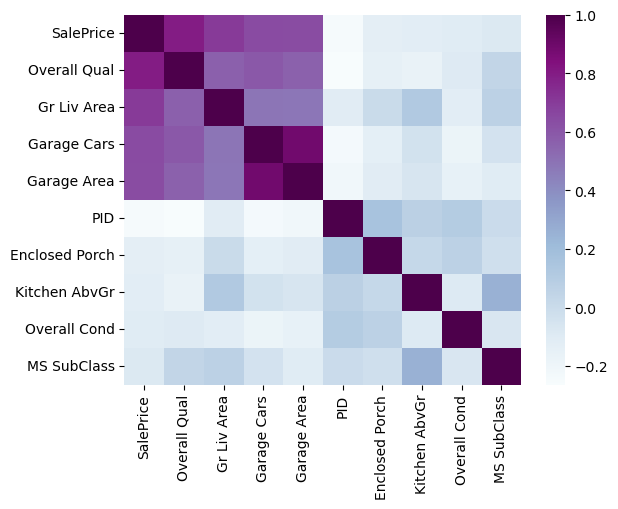

In [144]:
sns.heatmap(housing_new.corr(), cmap = "BuPu")
plt.show()

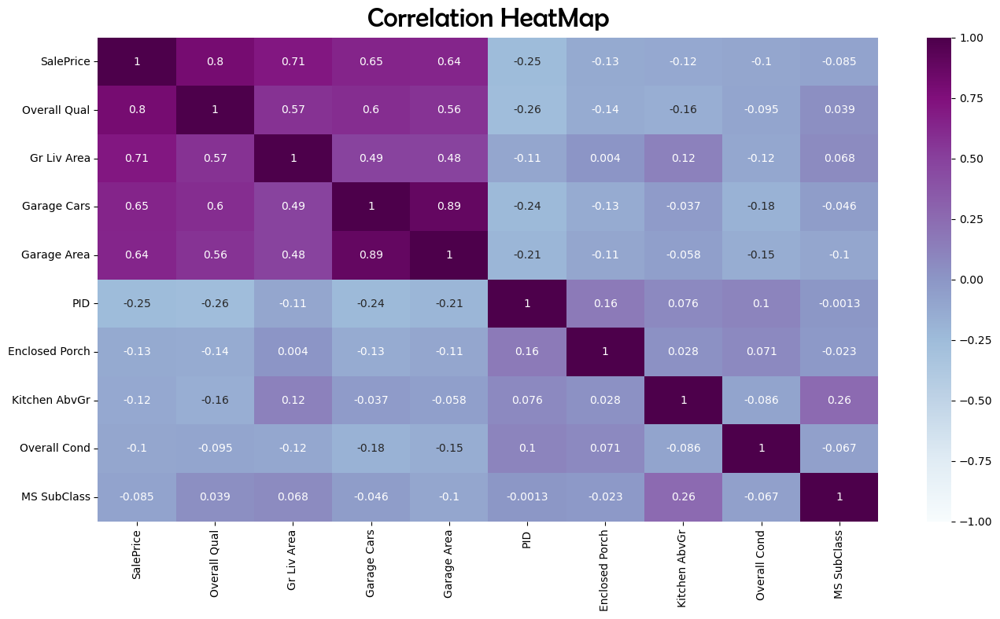

In [161]:
# Increase the size of the heatmap.
plt.figure(figsize = (16,8))


# Store heatmap in a variable to easily 
# access it when you want to include more features (such as title).
heatmap = sns.heatmap(housing_new.corr(), cmap = "BuPu", annot = True, vmin = -1, vmax = 1, )

# Give a title to the heatmap. 
heatmap.set_title("Correlation HeatMap", fontdict = font, pad = 10)
#(Pad defines the distance of the title from the top of the heatmap.)


plt.show()

## Triangle Correlation Heatmap

<Figure size 1600x600 with 0 Axes>

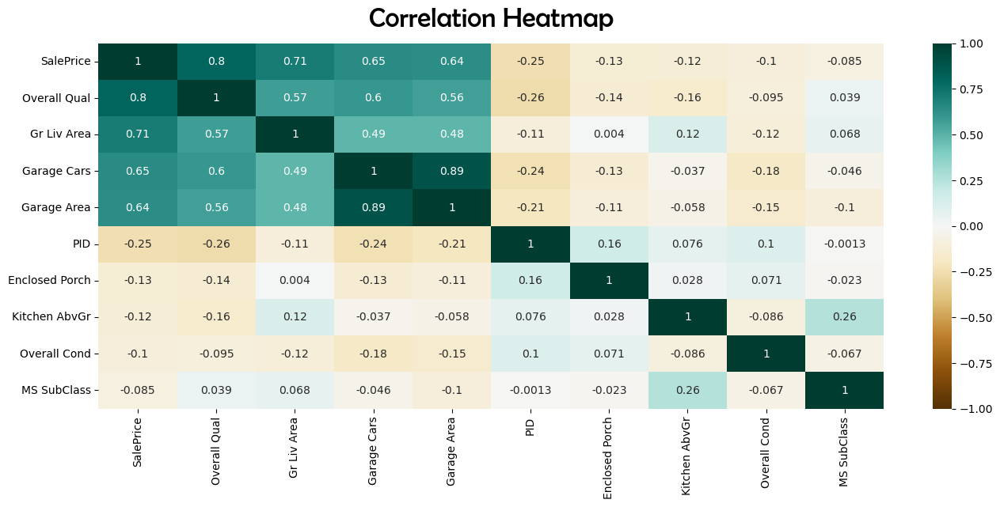

In [164]:
plt.figure(figsize=(16 , 6))

# create mask variable
#mask = np.triu(np.ones_like(housing_new , dtype = bool))

heatmap = sns.heatmap(housing_new.corr() , vmin = -1 , vmax = 1 ,\
                      annot = True , cmap = 'BrBG' ) # add mask here

heatmap.set_title('Correlation Heatmap' ,\
                  fontdict = font , pad = 15)

plt.show()

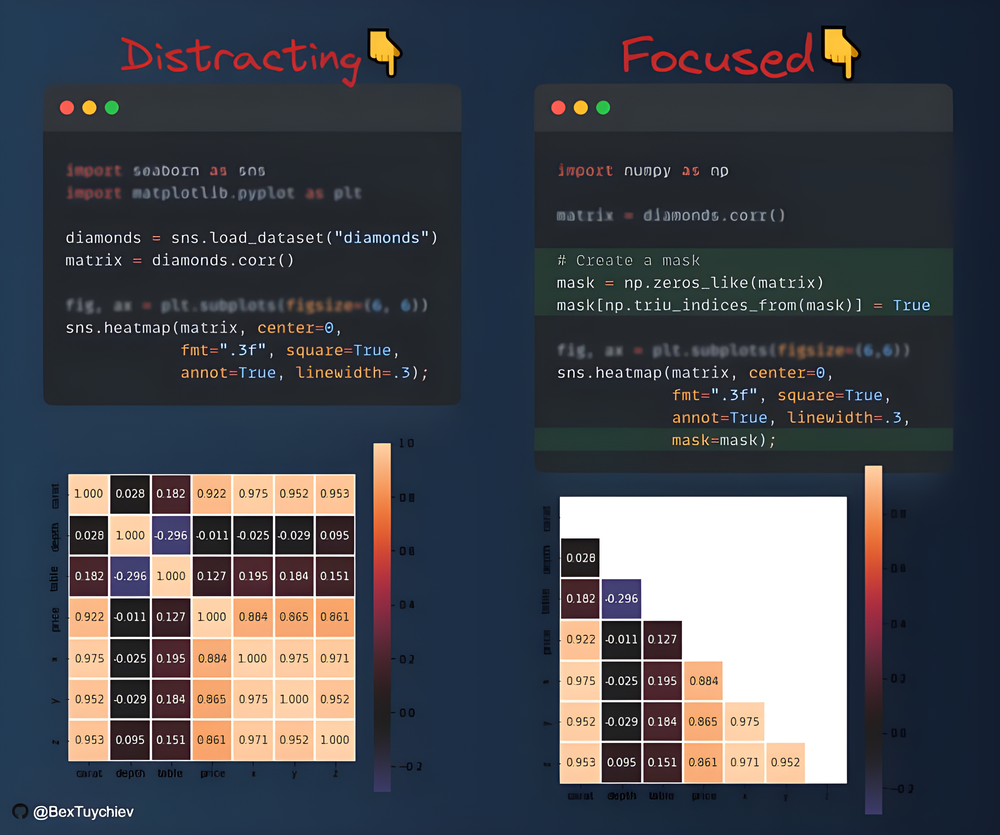

# But We Want To Focus Only On SalePrice Feature/Column

In [170]:
saleprice = final_data.corr()[["SalePrice"]]

<Figure size 900x1700 with 0 Axes>

<Figure size 900x1700 with 0 Axes>

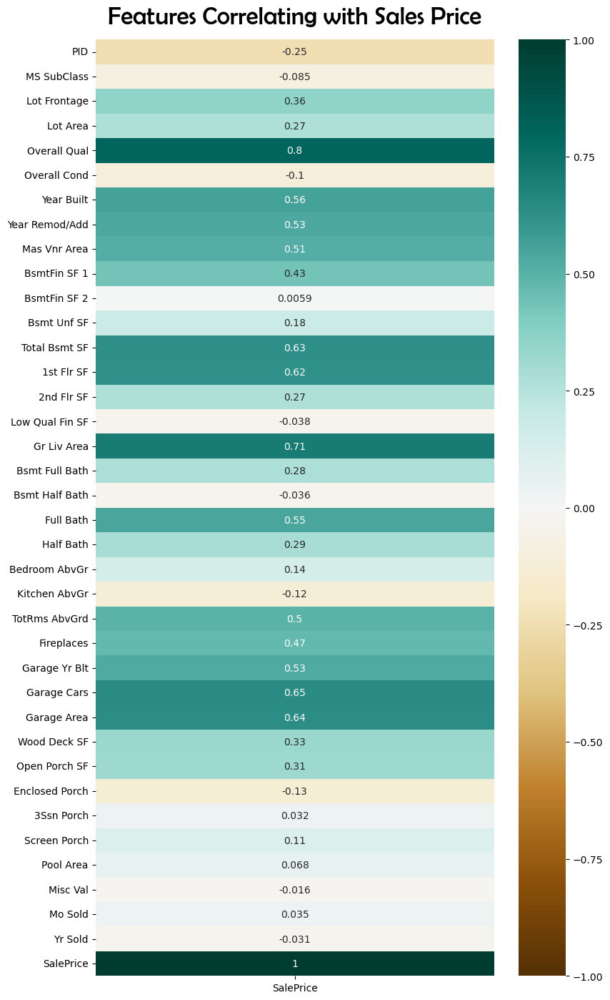

In [172]:
plt.figure(figsize=(9 , 17))

heatmap = sns.heatmap(saleprice , vmin = -1 , vmax = 1 ,\
                      annot = True , cmap = 'BrBG')

heatmap.set_title('Features Correlating with Sales Price',\
                  fontdict = font , pad = 16)

plt.show()

# Conclusion 
I have just completed it for my practice and I have learned many things from this 